### FUNNEL ANALYSIS ON SELF GENERATED DATASET




In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as make_subplots

In [7]:
plt.style.use('seaborn-v0_8')
sns.set_palette('husl')

print("GOOD")

GOOD


# LOAD DATASET

In [8]:
df=pd.read_csv('/content/funnel_analysis_data.csv')
df

,User_ID,Session_ID,Event,Timestamp,Device,Region,Channel,Product_Category,Revenue,Bounce_Flag
0,USR00001,SES00001,Browse,2025-11-03 02:02-32,Tablet,South,Google Ads,Electronics,0.00,Yes
1,USR00001,SES00001,Add to Cart,2025-11-03 02:05-32,Desktop,West,Google Ads,Sports,0.00,Yes
2,USR00002,SES00002,Browse,2025-11-11 23:03-42,Mobile,South,Email,Electronics,0.00,Yes
3,USR00002,SES00002,Add to Cart,2025-11-11 23:06-42,Tablet,North,Email,Sports,0.00,Yes
4,USR00002,SES00002,Checkout,2025-11-11 23:11-42,Tablet,South,Google Ads,Fashion,0.00,Yes
...,...,...,...,...,...,...,...,...,...,...
21454,USR09999,SES09999,Browse,2025-10-27 16:04-25,Desktop,North,Email,Fashion,0.00,Yes
21455,USR10000,SES10000,Browse,2025-11-23 12:49-47,Tablet,South,Social Media,Sports,0.00,Yes
21456,USR10000,SES10000,Add to Cart,2025-11-23 12:53-47,Tablet,South,Organic,Home,0.00,Yes
21457,USR10000,SES10000,Checkout,2025-11-23 12:56-47,Mobile,South,Organic,Electronics,0.00,Yes


# BASICS

In [9]:
print('top 5 rows')
df.head(5)

top 5 rows


,User_ID,Session_ID,Event,Timestamp,Device,Region,Channel,Product_Category,Revenue,Bounce_Flag
0,USR00001,SES00001,Browse,2025-11-03 02:02-32,Tablet,South,Google Ads,Electronics,0.0,Yes
1,USR00001,SES00001,Add to Cart,2025-11-03 02:05-32,Desktop,West,Google Ads,Sports,0.0,Yes
2,USR00002,SES00002,Browse,2025-11-11 23:03-42,Mobile,South,Email,Electronics,0.0,Yes
3,USR00002,SES00002,Add to Cart,2025-11-11 23:06-42,Tablet,North,Email,Sports,0.0,Yes
4,USR00002,SES00002,Checkout,2025-11-11 23:11-42,Tablet,South,Google Ads,Fashion,0.0,Yes


In [10]:
df.tail()

,User_ID,Session_ID,Event,Timestamp,Device,Region,Channel,Product_Category,Revenue,Bounce_Flag
21454,USR09999,SES09999,Browse,2025-10-27 16:04-25,Desktop,North,Email,Fashion,0.00,Yes
21455,USR10000,SES10000,Browse,2025-11-23 12:49-47,Tablet,South,Social Media,Sports,0.00,Yes
21456,USR10000,SES10000,Add to Cart,2025-11-23 12:53-47,Tablet,South,Organic,Home,0.00,Yes
21457,USR10000,SES10000,Checkout,2025-11-23 12:56-47,Mobile,South,Organic,Electronics,0.00,Yes
21458,USR10000,SES10000,Purchase,2025-11-23 12:59-47,Tablet,North,Google Ads,Electronics,335.76,No


In [11]:
#random dataset
df.sample(2)

,User_ID,Session_ID,Event,Timestamp,Device,Region,Channel,Product_Category,Revenue,Bounce_Flag
16486,USR07687,SES07687,Checkout,2025-10-29 02:50-25,Desktop,South,Google Ads,Home,0.0,Yes
17217,USR08019,SES08019,Add to Cart,2025-11-11 10:32-07,Mobile,East,Google Ads,Electronics,0.0,Yes


In [12]:
#total column names and number of columns

print(df.columns)

print(f"\n total number of columns {df.columns.nunique()}")

Index(['User_ID', 'Session_ID', 'Event', 'Timestamp', 'Device', 'Region',
       'Channel', 'Product_Category', 'Revenue', 'Bounce_Flag'],
      dtype='object')

 total number of columns 10


In [13]:
type(df)

pandas.core.frame.DataFrame

In [14]:
df.dtypes

,0
User_ID,object
Session_ID,object
Event,object
Timestamp,object
Device,object
Region,object
Channel,object
Product_Category,object
Revenue,float64
Bounce_Flag,object


In [15]:
#convert data type of of Timestamp from object to date time type

df['Timestamp'] = pd.to_datetime(df['Timestamp'], format='%Y-%m-%d %H:%M-%S')
print(df.dtypes)

User_ID                     object
Session_ID                  object
Event                       object
Timestamp           datetime64[ns]
Device                      object
Region                      object
Channel                     object
Product_Category            object
Revenue                    float64
Bounce_Flag                 object
dtype: object


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21459 entries, 0 to 21458
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   User_ID           21459 non-null  object        
 1   Session_ID        21459 non-null  object        
 2   Event             21459 non-null  object        
 3   Timestamp         21459 non-null  datetime64[ns]
 4   Device            21459 non-null  object        
 5   Region            21459 non-null  object        
 6   Channel           21459 non-null  object        
 7   Product_Category  21459 non-null  object        
 8   Revenue           21459 non-null  float64       
 9   Bounce_Flag       21459 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(8)
memory usage: 1.6+ MB


In [17]:
df.describe()

,Timestamp,Revenue
count,21459,21459.000000
mean,2025-11-09 00:05:19.714013184,54.343178
min,2025-10-24 23:05:22,0.000000
25%,2025-11-01 10:04:36,0.000000
50%,2025-11-09 02:26:06,0.000000
75%,2025-11-16 11:29:33.500000,0.000000
max,2025-11-23 23:03:24,1998.670000
std,NaN,266.063649


In [18]:
df.describe(include=object)

,User_ID,Session_ID,Event,Device,Region,Channel,Product_Category,Bounce_Flag
count,21459,21459,21459,21459,21459,21459,21459,21459
unique,10000,10000,4,3,4,4,5,2
top,USR03469,SES03469,Browse,Mobile,East,Email,Sports,Yes
freq,4,4,10000,7186,5421,5415,4395,20411


In [19]:
df.shape

(21459, 10)

In [20]:
pd.set_option("display.max_rows",None)

In [21]:
df

,User_ID,Session_ID,Event,Timestamp,Device,Region,Channel,Product_Category,Revenue,Bounce_Flag
0,USR00001,SES00001,Browse,2025-11-03 02:02:32,Tablet,South,Google Ads,Electronics,0.00,Yes
1,USR00001,SES00001,Add to Cart,2025-11-03 02:05:32,Desktop,West,Google Ads,Sports,0.00,Yes
2,USR00002,SES00002,Browse,2025-11-11 23:03:42,Mobile,South,Email,Electronics,0.00,Yes
3,USR00002,SES00002,Add to Cart,2025-11-11 23:06:42,Tablet,North,Email,Sports,0.00,Yes
4,USR00002,SES00002,Checkout,2025-11-11 23:11:42,Tablet,South,Google Ads,Fashion,0.00,Yes
5,USR00003,SES00003,Browse,2025-11-10 08:46:54,Tablet,West,Organic,Home,0.00,Yes
6,USR00003,SES00003,Add to Cart,2025-11-10 08:49:54,Desktop,East,Social Media,Home,0.00,Yes
7,USR00003,SES00003,Checkout,2025-11-10 08:54:54,Desktop,South,Social Media,Beauty,0.00,Yes
8,USR00004,SES00004,Browse,2025-11-02 07:55:48,Desktop,South,Organic,Electronics,0.00,Yes
9,USR00004,SES00004,Add to Cart,2025-11-02 07:59:48,Mobile,West,Google Ads,Electronics,0.00,Yes


## DATA PREPROCESSING AND CLEANING

In [22]:
#null and duplicate

print(df.isnull().sum())

print("......")

print(df.duplicated().sum())

print("......")

print(df.nunique())

User_ID             0
Session_ID          0
Event               0
Timestamp           0
Device              0
Region              0
Channel             0
Product_Category    0
Revenue             0
Bounce_Flag         0
dtype: int64
......
0
......
User_ID             10000
Session_ID          10000
Event                   4
Timestamp           21379
Device                  3
Region                  4
Channel                 4
Product_Category        5
Revenue              1047
Bounce_Flag             2
dtype: int64


In [23]:
#extracting date and time values from timestamp for deep analysis

df['Date']=df['Timestamp'].dt.date
df['DayOfWeek']=df['Timestamp'].dt.day_name()
df['Hour']=df['Timestamp'].dt.hour
df['WeekNumber']=df['Timestamp'].dt.isocalendar().week

In [24]:
df.head()

,User_ID,Session_ID,Event,Timestamp,Device,Region,Channel,Product_Category,Revenue,Bounce_Flag,Date,DayOfWeek,Hour,WeekNumber
0,USR00001,SES00001,Browse,2025-11-03 02:02:32,Tablet,South,Google Ads,Electronics,0.0,Yes,2025-11-03,Monday,2,45
1,USR00001,SES00001,Add to Cart,2025-11-03 02:05:32,Desktop,West,Google Ads,Sports,0.0,Yes,2025-11-03,Monday,2,45
2,USR00002,SES00002,Browse,2025-11-11 23:03:42,Mobile,South,Email,Electronics,0.0,Yes,2025-11-11,Tuesday,23,46
3,USR00002,SES00002,Add to Cart,2025-11-11 23:06:42,Tablet,North,Email,Sports,0.0,Yes,2025-11-11,Tuesday,23,46
4,USR00002,SES00002,Checkout,2025-11-11 23:11:42,Tablet,South,Google Ads,Fashion,0.0,Yes,2025-11-11,Tuesday,23,46


In [25]:
df['Event_Sequence']=df.groupby('Session_ID').cumcount()+1

In [26]:
df.head()

,User_ID,Session_ID,Event,Timestamp,Device,Region,Channel,Product_Category,Revenue,Bounce_Flag,Date,DayOfWeek,Hour,WeekNumber,Event_Sequence
0,USR00001,SES00001,Browse,2025-11-03 02:02:32,Tablet,South,Google Ads,Electronics,0.0,Yes,2025-11-03,Monday,2,45,1
1,USR00001,SES00001,Add to Cart,2025-11-03 02:05:32,Desktop,West,Google Ads,Sports,0.0,Yes,2025-11-03,Monday,2,45,2
2,USR00002,SES00002,Browse,2025-11-11 23:03:42,Mobile,South,Email,Electronics,0.0,Yes,2025-11-11,Tuesday,23,46,1
3,USR00002,SES00002,Add to Cart,2025-11-11 23:06:42,Tablet,North,Email,Sports,0.0,Yes,2025-11-11,Tuesday,23,46,2
4,USR00002,SES00002,Checkout,2025-11-11 23:11:42,Tablet,South,Google Ads,Fashion,0.0,Yes,2025-11-11,Tuesday,23,46,3


In [27]:
print(f'Total USER IDs{df['User_ID'].nunique()}')
print(f'\nTotal SESSION IDs{df['Session_ID'].nunique()}')
print(f'\nDATE RANGE {df['Date'].min()} to {df['Date'].max()}')

Total USER IDs10000

Total SESSION IDs10000

DATE RANGE 2025-10-24 to 2025-11-23


## FUNNEL ANALYSIS

In [28]:
#Users at Each Funnel Stage
funnel_stages = ['Browse', 'Add to Cart', 'Checkout', 'Purchase']

funnel_counts = (
    df.groupby("Event")["User_ID"]
      .nunique()
      .reindex(funnel_stages)
)

print(funnel_counts)

Event
Browse         10000
Add to Cart     6978
Checkout        3433
Purchase        1048
Name: User_ID, dtype: int64


In [29]:
#Conversion %, Drop-off %, Overall Conversion

funnel_df = pd.DataFrame({
    "Stage": funnel_stages,
    "Users": funnel_counts.values
})

funnel_df["Conversion_from_Previous"] = funnel_df["Users"] / funnel_df["Users"].shift(1)
funnel_df.loc[0, "Conversion_from_Previous"] = 1.0


funnel_df["Dropoff_from_Previous"] = 1 - funnel_df["Conversion_from_Previous"]

funnel_df["Overall_Conversion"] = funnel_df["Users"] / funnel_df["Users"].iloc[0]

print(funnel_df)

         Stage  Users  Conversion_from_Previous  Dropoff_from_Previous  \
0       Browse  10000                  1.000000               0.000000   
1  Add to Cart   6978                  0.697800               0.302200   
2     Checkout   3433                  0.491975               0.508025   
3     Purchase   1048                  0.305272               0.694728   

   Overall_Conversion  
0              1.0000  
1              0.6978  
2              0.3433  
3              0.1048  


In [30]:
#Revenue

total_revenue = df[df["Event"]=="Purchase"]["Revenue"].sum()
avg_order_value = df[df["Event"]=="Purchase"]["Revenue"].mean()

print("Total Revenue:", total_revenue)
print("Average Order Value:", avg_order_value)

Total Revenue: 1166150.26
Average Order Value: 1112.7387977099236


In [31]:
#Device wise Funnel
device_funnel = (
    df.groupby(["Device", "Event"])["User_ID"]
      .nunique()
      .unstack()
      .reindex(columns=funnel_stages)
      .fillna(0)
)

device_funnel


Event,Browse,Add to Cart,Checkout,Purchase
Device,,,,
Desktop,3325,2329,1139,326
Mobile,3260,2375,1176,375
Tablet,3415,2274,1118,347


In [32]:
device_funnel["Conv_Browse_to_Cart"] = (
    device_funnel["Add to Cart"] / device_funnel["Browse"]
)

device_funnel["Conv_Cart_to_Checkout"] = (
    device_funnel["Checkout"] / device_funnel["Add to Cart"]
)

device_funnel["Conv_Checkout_to_Purchase"] = (
    device_funnel["Purchase"] / device_funnel["Checkout"]
)

device_funnel["Overall_Conversion"] = (
    device_funnel["Purchase"] / device_funnel["Browse"]
)

device_funnel


Event,Browse,Add to Cart,Checkout,Purchase,Conv_Browse_to_Cart,Conv_Cart_to_Checkout,Conv_Checkout_to_Purchase,Overall_Conversion
Device,,,,,,,,
Desktop,3325,2329,1139,326,0.700451,0.489051,0.286216,0.098045
Mobile,3260,2375,1176,375,0.728528,0.495158,0.318878,0.115031
Tablet,3415,2274,1118,347,0.665886,0.491645,0.310376,0.101611


In [33]:
#Where Are Users Dropping Off Most

dropoff_points = funnel_df["Dropoff_from_Previous"].sort_values(ascending=False)
dropoff_points


,Dropoff_from_Previous
3,0.694728
2,0.508025
1,0.302200
0,0.000000


In [34]:
#Channel-wise Funnel
channel_funnel = df.groupby(["Channel", "Event"])["User_ID"].nunique().unstack().fillna(0)

channel_funnel["Overall_Conversion"] = (
    channel_funnel["Purchase"] / channel_funnel["Browse"]
)

channel_funnel.sort_values("Overall_Conversion", ascending=False)

Event,Add to Cart,Browse,Checkout,Purchase,Overall_Conversion
Channel,,,,,
Email,1763,2504,873,275,0.109824
Google Ads,1782,2475,856,266,0.107475
Social Media,1671,2478,860,260,0.104923
Organic,1762,2543,844,247,0.097129


In [35]:
#Bounce Analysis
#Bounce_Flag = Yes (all non-Purchase events)
#Bounce_Flag = No (for Purchasers)

overall_bounce = (df['Bounce_Flag'] == 'Yes').mean()
print(overall_bounce)

0.9511626823244327


In [36]:
#Session-Based Funnel
session_funnel = df.groupby(["Session_ID","Event"])["User_ID"].count().unstack().fillna(0)
session_funnel


Event,Add to Cart,Browse,Checkout,Purchase
Session_ID,,,,
SES00001,1.0,1.0,0.0,0.0
SES00002,1.0,1.0,1.0,0.0
SES00003,1.0,1.0,1.0,0.0
SES00004,1.0,1.0,0.0,0.0
SES00005,0.0,1.0,0.0,0.0
SES00006,1.0,1.0,1.0,1.0
SES00007,1.0,1.0,1.0,0.0
SES00008,1.0,1.0,0.0,0.0
SES00009,1.0,1.0,1.0,0.0


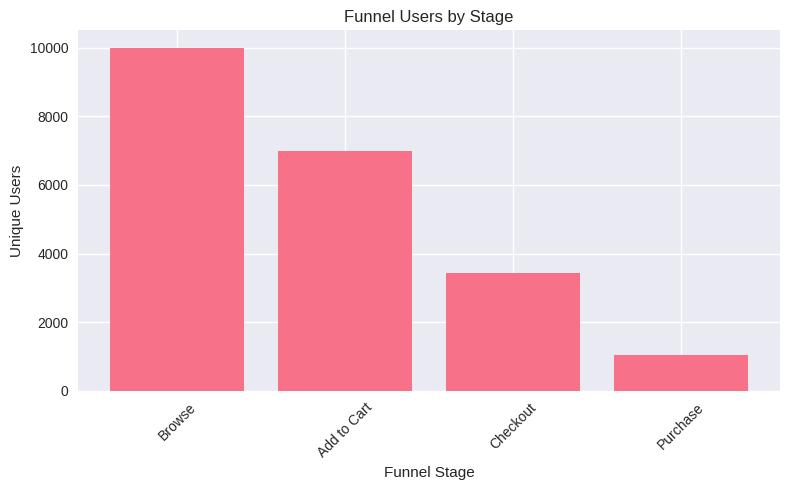

In [37]:
plt.figure(figsize=(8,5))
plt.bar(funnel_stages, funnel_counts)
plt.xlabel("Funnel Stage")
plt.ylabel("Unique Users")
plt.title("Funnel Users by Stage")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


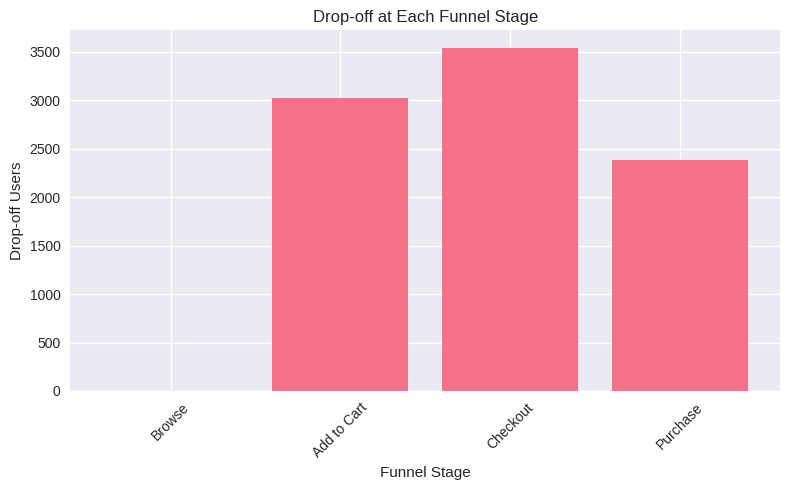

In [38]:
dropoffs = funnel_counts.shift(1) - funnel_counts
dropoffs.iloc[0] = 0  # No drop-off for Browse

plt.figure(figsize=(8,5))
plt.bar(funnel_stages, dropoffs)
plt.xlabel("Funnel Stage")
plt.ylabel("Drop-off Users")
plt.title("Drop-off at Each Funnel Stage")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


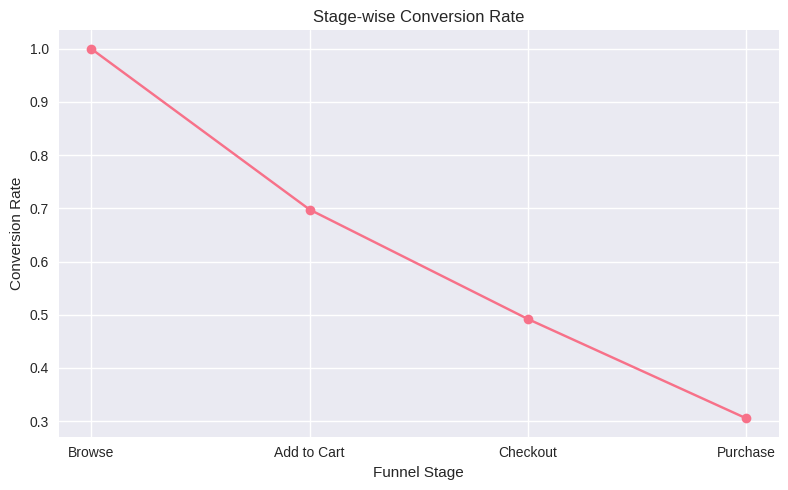

In [39]:
conv_rates = funnel_counts / funnel_counts.shift(1)
conv_rates.iloc[0] = 1.0

plt.figure(figsize=(8,5))
plt.plot(funnel_stages, conv_rates, marker="o")
plt.xlabel("Funnel Stage")
plt.ylabel("Conversion Rate")
plt.title("Stage-wise Conversion Rate")
plt.grid(True)
plt.tight_layout()
plt.show()


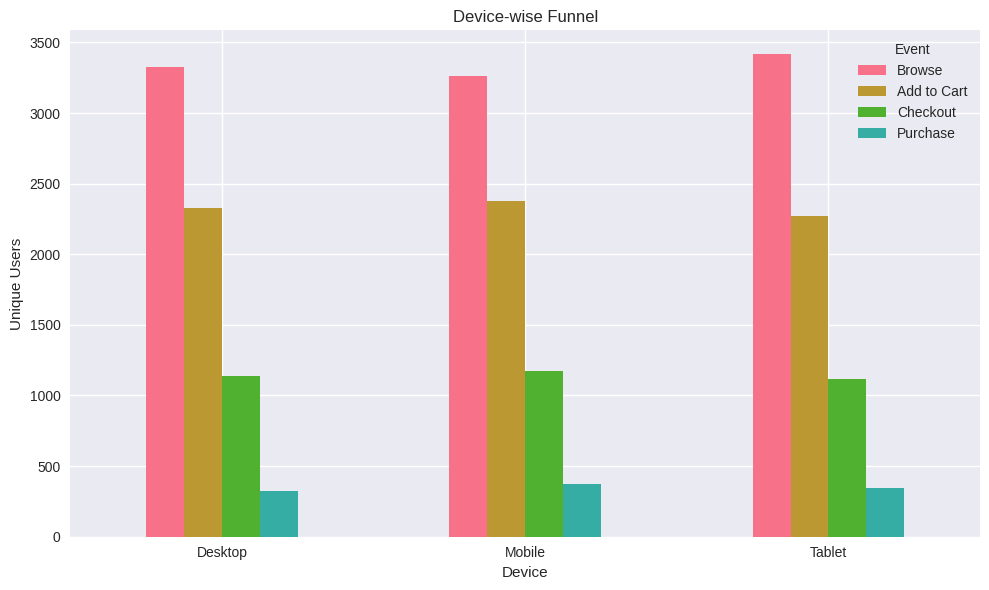

In [40]:
device_funnel = (
    df.groupby(["Device", "Event"])["User_ID"]
      .nunique()
      .unstack()
      .reindex(columns=funnel_stages)
      .fillna(0)
)

device_funnel.plot(kind="bar", figsize=(10,6))
plt.title("Device-wise Funnel")
plt.xlabel("Device")
plt.ylabel("Unique Users")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


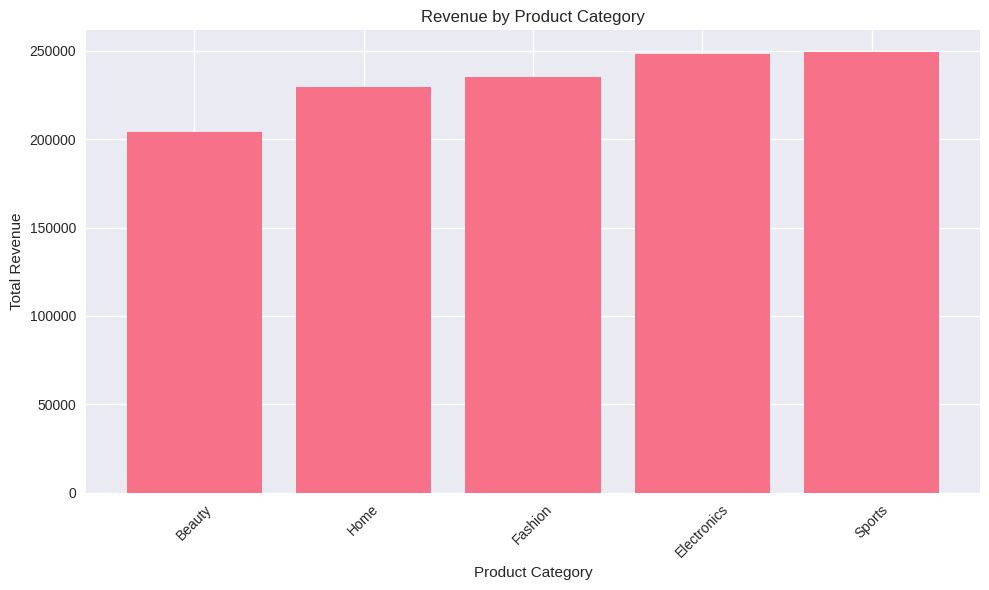

In [41]:
revenue_by_category = (
    df[df["Event"]=="Purchase"]
    .groupby("Product_Category")["Revenue"]
    .sum()
    .sort_values()
)

plt.figure(figsize=(10,6))
plt.bar(revenue_by_category.index, revenue_by_category.values)
plt.xlabel("Product Category")
plt.ylabel("Total Revenue")
plt.title("Revenue by Product Category")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
